# UC San Diego: Neural Data Science
## Final Project Title (change this to your project's title)

## Permissions

Place an `X` in the appropriate bracket below to specify if you would like your group's project to be made available to the public. (Note that student names will be included (but PIDs will be scraped from any groups who include their PIDs).

* [  ] YES - make available
* [  ] NO - keep private

# Names

- Rodrigo Lizaran-Molina
- Antara Sengupta
- Kyle Vu
- Austin Calza

# Overview

* Write a clear, 3-4 sentence summary of what you did and why.

<a id='research_question'></a>
# Research Question

* One sentence that describes the question you address in your project. Make sure what you’re measuring (variables) to answer your question is clear!


<a id='background'></a>

## Background & Prior Work

* In 2-3 paragraphs, describe the motivation behind your question. What’s the big picture, and why is it interesting? Are there published papers addressing aspects of your question? You should cite at least three primary references here. You are welcome to replicate published papers using publicly available data, just cite them and explain why!

References (include links):
- 1)
- 2)

# Hypothesis


*Fill in your hypotheses here*

# Dataset(s)

*Fill in your dataset information here*

(Copy this information for each dataset)
- Dataset Name:
- Link to the dataset:
- Number of observations:

1-2 sentences describing each dataset. 

If you plan to use multiple datasets, add 1-2 sentences about how you plan to combine these datasets.

# Data Analysis

In [1]:
# import libraries and dependencies

import os, requests
import numpy as np
import matplotlib.pyplot as plt
from skimage.util import montage
from sklearn.decomposition import PCA
import matplotlib.patheffects as path_effects
import tensorflow as tf
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Input, Dense, Flatten, Dropout, Reshape
from tensorflow.keras.optimizers import Adam
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
import warnings

warnings.filterwarnings("ignore")
%config InlineBackend.figure_format = 'retina'


2024-06-07 04:32:44.809576: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-07 04:32:44.861230: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Data Collection and Wrangling

In [2]:
# Download data
fnames = ["kay_labels.npy", "kay_labels_val.npy", "kay_images.npz"]
urls = ["https://osf.io/r638s/download",
        "https://osf.io/yqb3e/download",
        "https://osf.io/ymnjv/download"]

for fname, url in zip(fnames, urls):
  if not os.path.isfile(fname):
    try:
      r = requests.get(url)
    except requests.ConnectionError:
      print("!!! Failed to download data !!!")
    else:
      if r.status_code != requests.codes.ok:
        print("!!! Failed to download data !!!")
      else:
        print(f"Downloading {fname}...")
        with open(fname, "wb") as fid:
          fid.write(r.content)
        print(f"Download {fname} completed!")

In [3]:
with np.load(fname) as dobj:
  dat = dict(**dobj)
labels = np.load('kay_labels.npy')
val_labels = np.load('kay_labels_val.npy')


print(f'Stimuli shape: {dat["stimuli"].shape}')
print(f'Response shape: {dat["responses"].shape}')
print(f'Labels shape: {labels.shape}')

Stimuli shape: (1750, 128, 128)
Response shape: (1750, 8428)
Labels shape: (4, 1750)



`labels` is a 4 by stim array of class names:  
- row 3 has the labels predicted by a deep neural network (DNN) trained on Imagenet
- rows 0-2 correspond to different levels of the wordnet hierarchy for the DNN predictions

In [4]:
dat["responses_test"].shape

(120, 8428)

In [5]:
def get_image_and_labels(index, stimuli, labels):
    """
    Retrieve the image and its corresponding labels from the dataset.
    
    Parameters:
    index (int): The index of the image in the dataset.
    stimuli (np.array): The array containing the images.
    labels (np.array): The array containing the labels.
    
    Returns:
    np.array: The image at the given index.
    list: The labels corresponding to the image.
    """
    image = stimuli[index]
    image_labels = [labels[j][index] for j in range(labels.shape[0])]
    
    return image, image_labels

def print_image_and_labels(index, stimuli, labels):
    """
    Display the image and print its labels.
    
    Parameters:
    index (int): The index of the image to be displayed.
    stimuli (np.array): The array of images.
    labels (np.array): The array of labels.
    """
    image, image_labels = get_image_and_labels(index, stimuli, labels)
    plt.imshow(image, cmap='gray')  # Adjust 'cmap' as necessary for your image data
    plt.title(f"Labels: {image_labels}")
    plt.colorbar()
    plt.show()
    print(f"Labels for image at index {index}: {image_labels}")


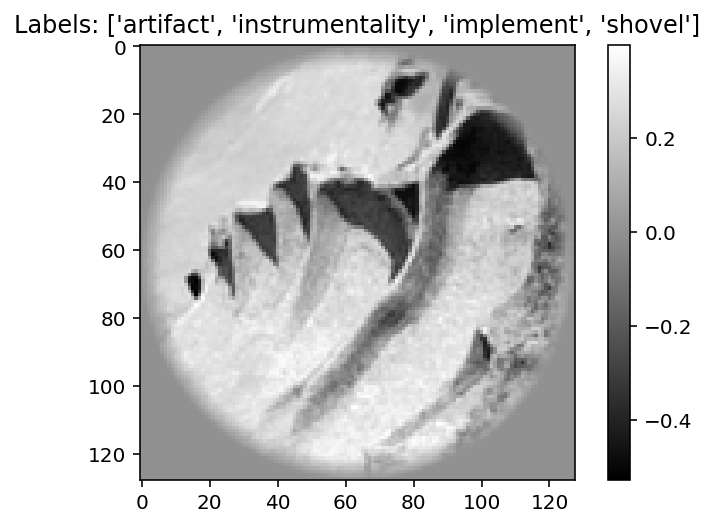

Labels for image at index 24: ['artifact', 'instrumentality', 'implement', 'shovel']


In [6]:
print_image_and_labels(24, dat["stimuli_test"], val_labels)

Exploration of the images shows that for each image, there are 4 labels associated with it. However, some of the labels don't always make the most sense as the image above has the classification of shovel when it does not look like a shovel in the slightest. Research was unable to help us figure out why for some of them have wierd labels but our assumption going forward is that the image labels are correct.

In [8]:
print(dat.keys())
print(dat['roi_names'])
print(dat['roi'])

dict_keys(['stimuli', 'stimuli_test', 'responses', 'responses_test', 'roi', 'roi_names'])
['Other' 'V1' 'V2' 'V3' 'V3A' 'V3B' 'V4' 'LatOcc']
[3 3 3 ... 3 3 6]


`dat` has the following fields:  
- `stimuli`: stim x i x j array of grayscale stimulus images
- `stimuli_test`: stim x i x j array of grayscale stimulus images in the test set  
- `responses`: stim x voxel array of z-scored BOLD response amplitude
- `responses_test`:  stim x voxel array of z-scored BOLD response amplitude in the test set  
- `roi`: array of voxel labels which respond to the 8428 response voxels in the responses arrays
- `roi_names`: array of names corresponding to voxel labels

In [9]:
v1_index = np.where(dat['roi'] == 1)[0]
v1_responses = dat['responses'][:, v1_index]

v2_index = np.where(dat['roi'] == 2)[0]
v2_responses = dat['responses'][:, v2_index]

v3_index = np.where(dat['roi'] == 3)[0]
v3_responses = dat['responses'][:, v3_index]

v3a_index = np.where(dat['roi'] == 4)[0]
v3a_responses = dat['responses'][:, v3a_index]

v3b_index = np.where(dat['roi'] == 5)[0]
v3b_responses = dat['responses'][:, v3b_index]

v4_index = np.where(dat['roi'] == 6)[0]
v4_responses = dat['responses'][:, v4_index]

LatOcc_index = np.where(dat['roi'] == 7)[0]
LatOcc_responses = dat['responses'][:, LatOcc_index]

print(f"{v1_responses.shape}")
print(f"{v2_responses.shape}")
print(f"{v3_responses.shape}")
print(f"{v3a_responses.shape}")
print(f"{v3b_responses.shape}")
print(f"{v4_responses.shape}")
print(f"{LatOcc_responses.shape}")

(1750, 1294)
(1750, 2083)
(1750, 1790)
(1750, 484)
(1750, 314)
(1750, 1535)
(1750, 928)


Split reponses into individual arrays with each voxel

This is the number of voxels in each ROI. Note that `"Other"` voxels have been removed from this version of the dataset:

We are going to use the stimuli, responses and roi

# Data Visualization

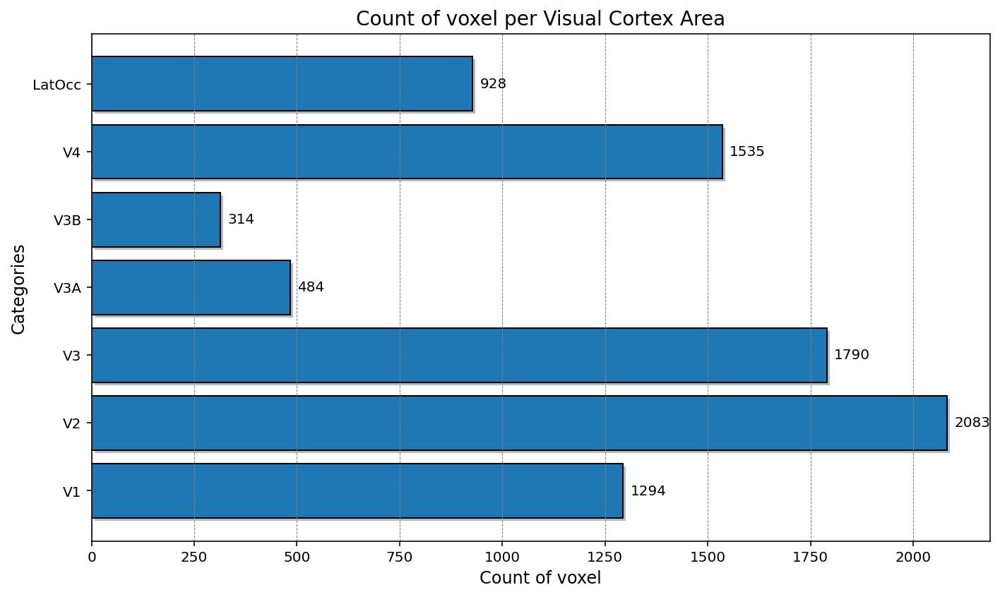

In [10]:
roi_counts = dict(zip(dat["roi_names"], np.bincount(dat["roi"])))

values = list(roi_counts.values())[1:]
names = list(roi_counts.keys())[1:]

# Create a horizontal bar plot
fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.barh(names, values, edgecolor='black')

# Add grid lines
ax.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray', axis='x')

# Add value annotations to each bar
for bar in bars:
    width = bar.get_width()
    ax.annotate(f'{width}', xy=(width, bar.get_y() + bar.get_height() / 2),
                xytext=(5, 0), textcoords="offset points",
                ha='left', va='center', fontsize=10, color='black')

# Customize title and labels
plt.xlabel('Count of voxel', fontsize=12)
plt.ylabel('Categories', fontsize=12)
plt.title('Count of voxel per Visual Cortex Area', fontsize=14)

# Customize ticks
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Add shadow effect to the bars
for bar in bars:
    bar.set_path_effects([plt.matplotlib.patheffects.withSimplePatchShadow()])

# Adjust the layout and spacing
plt.tight_layout()

# Show the plot
plt.show()

Each stimulus is a 128 x 128 grayscale array with 1750 total of images

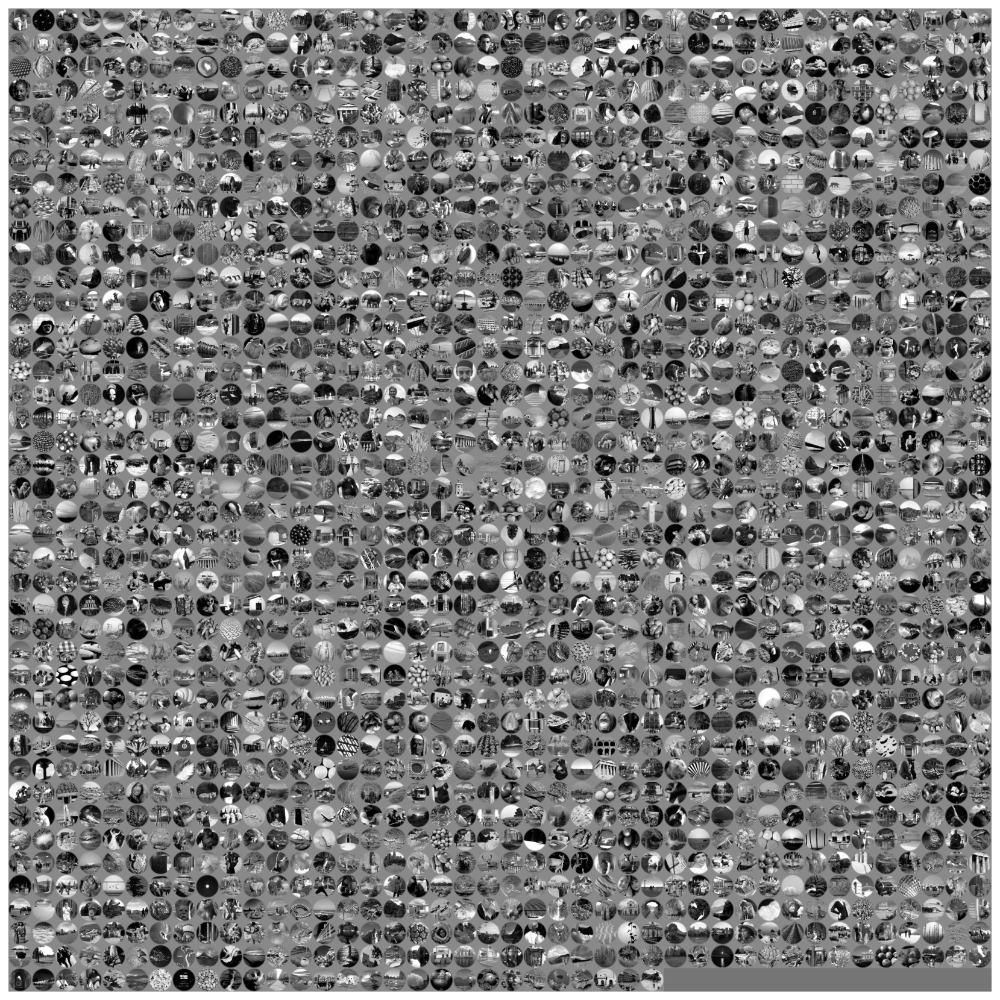

In [11]:
out = montage(dat['stimuli'])
f, ax = plt.subplots(figsize = (15,15))
plt.imshow(out, cmap = 'gray'); plt.axis('off');

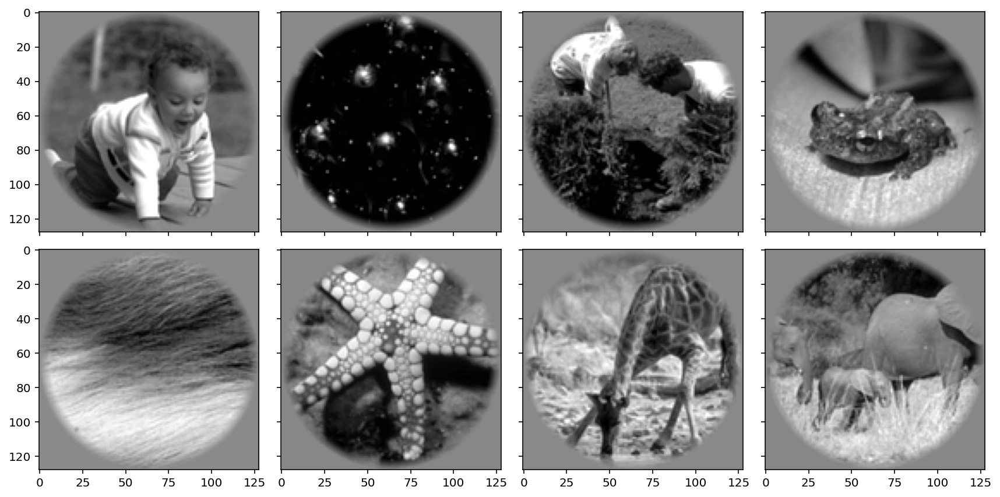

In [12]:
fig, axs = plt.subplots(2, 4, figsize=(12, 6), sharex=True, sharey=True)
for ax, im in zip(axs.flat, dat["stimuli"]):
  ax.imshow(im, cmap="gray")
fig.tight_layout()
fig.show()

Each stimulus is associated with a pattern of BOLD response across voxels in visual cortex:

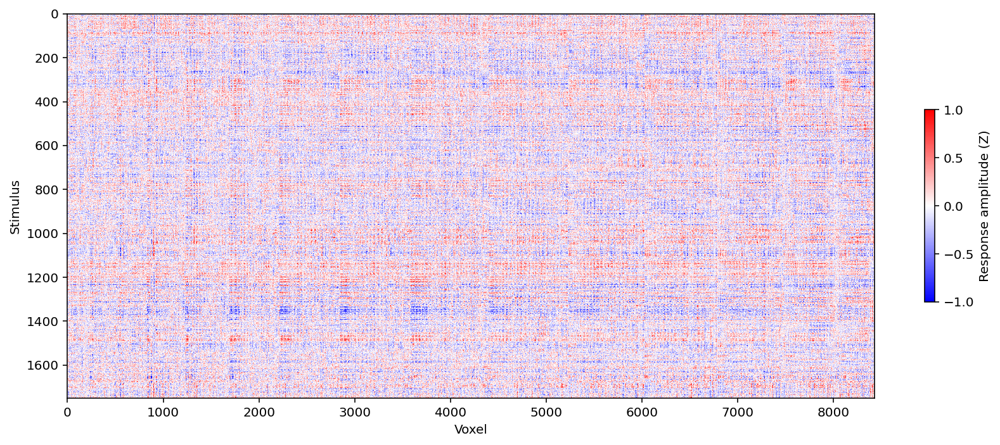

In [13]:
fig, ax = plt.subplots(figsize=(12, 5))
ax.set(xlabel="Voxel", ylabel="Stimulus")
heatmap = ax.imshow(dat["responses"],
                    aspect="auto", vmin=-1, vmax=1, cmap="bwr")
fig.colorbar(heatmap, shrink=.5, label="Response amplitude (Z)")
fig.tight_layout()
fig.show()

Each horizontal line represents the voxel/response from the brain for each stimuli. As you can see, there are strips of similar responses indicating similar stimulis have similiar brain responses.

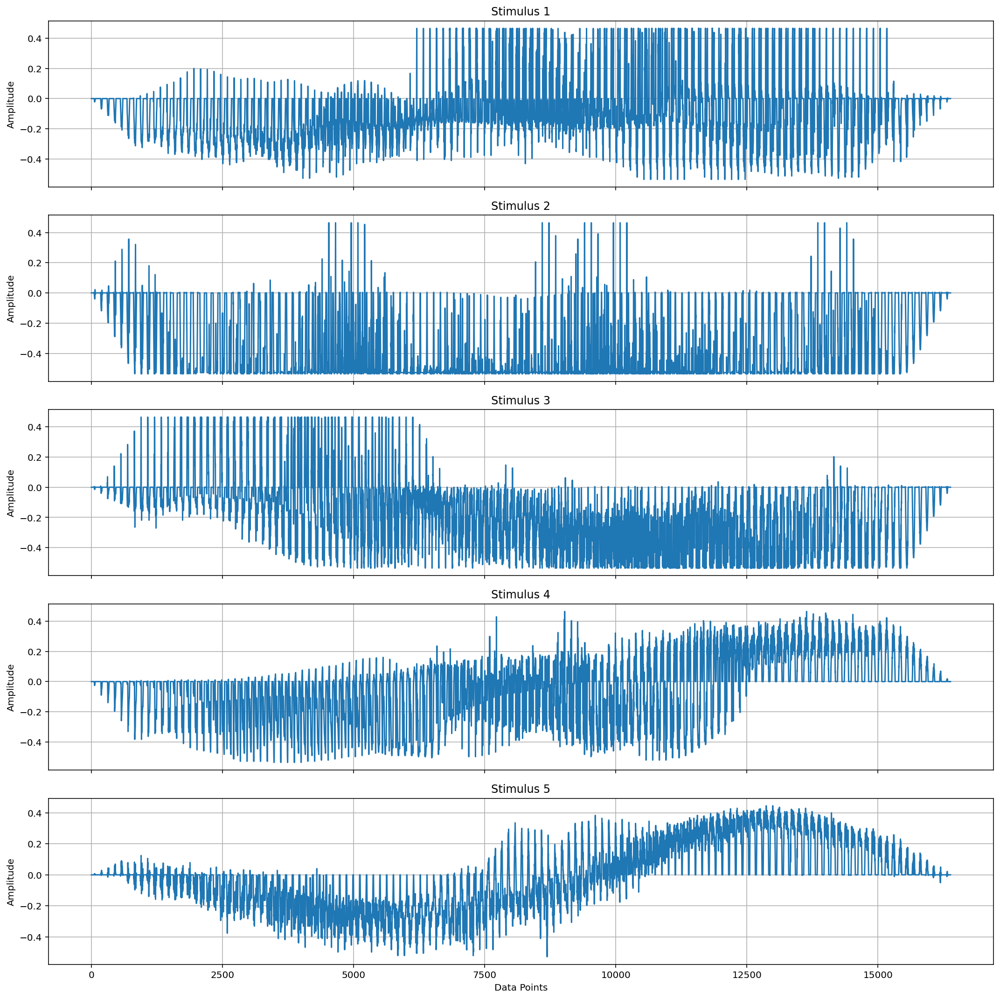

In [14]:
# Create 10 subplots for the first 10 stimuli in the data array
fig, axes = plt.subplots(5, 1, figsize=(15, 15), sharex=True)

# Flatting the data of stimilis
flat_dat = np.reshape(dat['stimuli'], (dat['stimuli'].shape[0],-1))

for i in range(5):
    axes[i].plot(flat_dat[i])
    axes[i].set_title(f'Stimulus {i+1}')
    axes[i].set_ylabel('Amplitude')
    axes[i].grid(True)

plt.xlabel('Data Points')
plt.tight_layout()
plt.show()

Visual representation of the first five stimuli (images) in a flattened version of their pixel representations. Each graph depicts the pixel intensity values for one of the images, showcasing the variations in pixel intensity across the entire image.

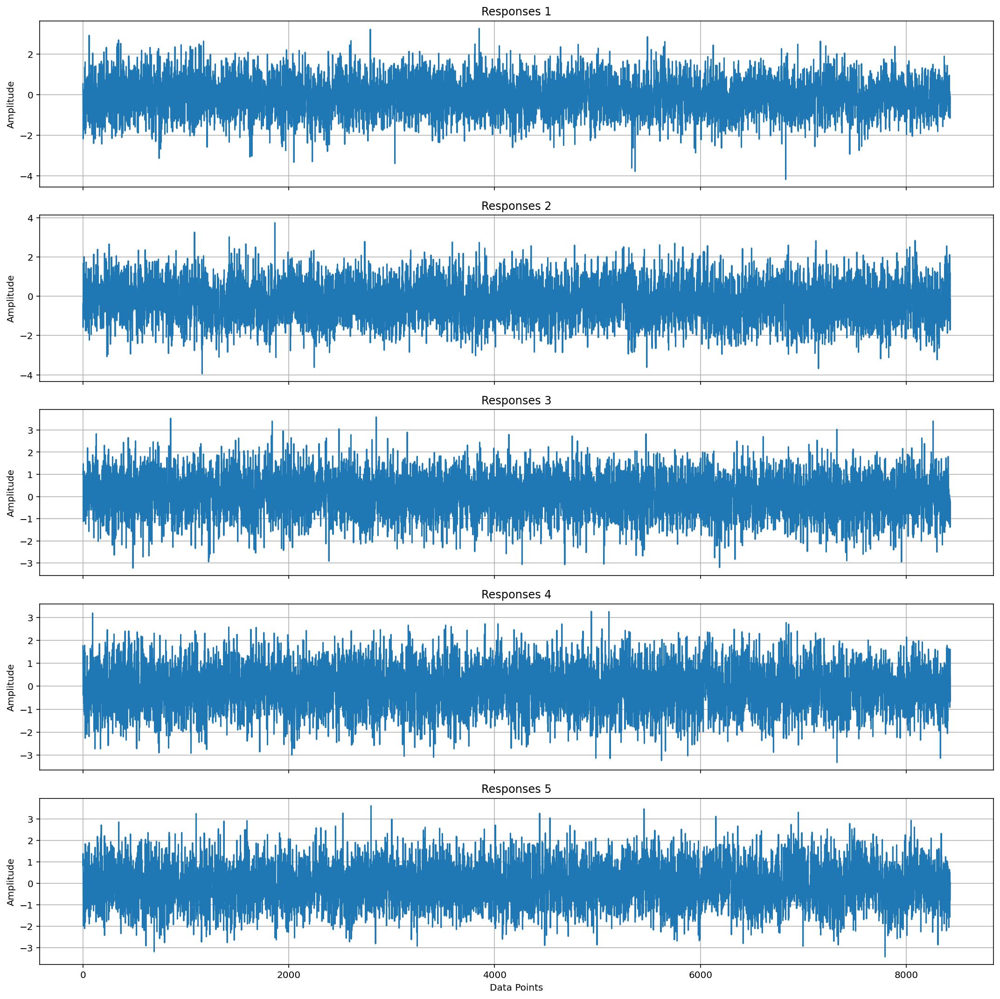

In [15]:
# Create 10 subplots for the first 10 stimuli in the data array
fig, axes = plt.subplots(5, 1, figsize=(15, 15), sharex=True)

for i in range(5):
    axes[i].plot(dat['responses'][i])
    axes[i].set_title(f'Responses {i+1}')
    axes[i].set_ylabel('Amplitude')
    axes[i].grid(True)

plt.xlabel('Data Points')
plt.tight_layout()
plt.show()

Visual representation of the brain activity in response to the first five stimuli (images). Each graph depicts the neural response patterns corresponding to one of the images, highlighting the variations in brain activity across different regions.

# Data Analysis & Results

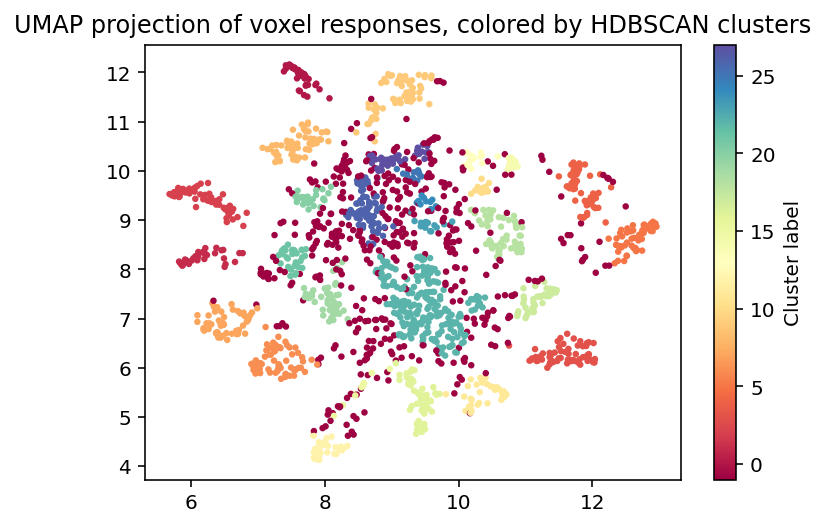

In [20]:
import umap
import hdbscan
import numpy as np
import matplotlib.pyplot as plt

responses = dat['responses']

# UMAP Reduction
reducer = umap.UMAP(n_neighbors=10, min_dist=0.1, metric='euclidean')
embedding = reducer.fit_transform(responses)

# HDBSCAN Clustering
clusterer = hdbscan.HDBSCAN(min_cluster_size=10, gen_min_span_tree=True)
cluster_labels = clusterer.fit_predict(embedding)

# Visualization
plt.scatter(embedding[:, 0], embedding[:, 1], c=cluster_labels, cmap='Spectral', s=5)
plt.colorbar(label='Cluster label')
plt.title('UMAP projection of voxel responses, colored by HDBSCAN clusters')
plt.show()

This graph shows one of our attempts to reduce the dimensions of the high dim voxel responses to allow us to check if there were any similarities from within each cluster. This approach uses a UMAP dim reduction technique and HDBScan to fit the number of clusters. A large presence of a -1 cluster indicates datapoints with large amounts of noise which were not able to be categorized into a cluster.

In [21]:
import pandas as pd
labels_transposed = labels.T  # this will transpose to (1750, 4)

# Create a DataFrame that includes the cluster labels and the four types of labels for each datapoint
df = pd.DataFrame(data=labels_transposed, columns=['Label1', 'Label2', 'Label3', 'Label4'])
df['Cluster'] = cluster_labels

     Label1           Label2     Label3        Label4  Cluster
0  artifact  instrumentality  equipment  croquet ball        9
1    entity      round shape     sphere        bubble        9
2    animal       vertebrate     mammal      komondor        9
3    animal       vertebrate  amphibian   tailed frog        9
4    animal       vertebrate     mammal    Pomeranian        9


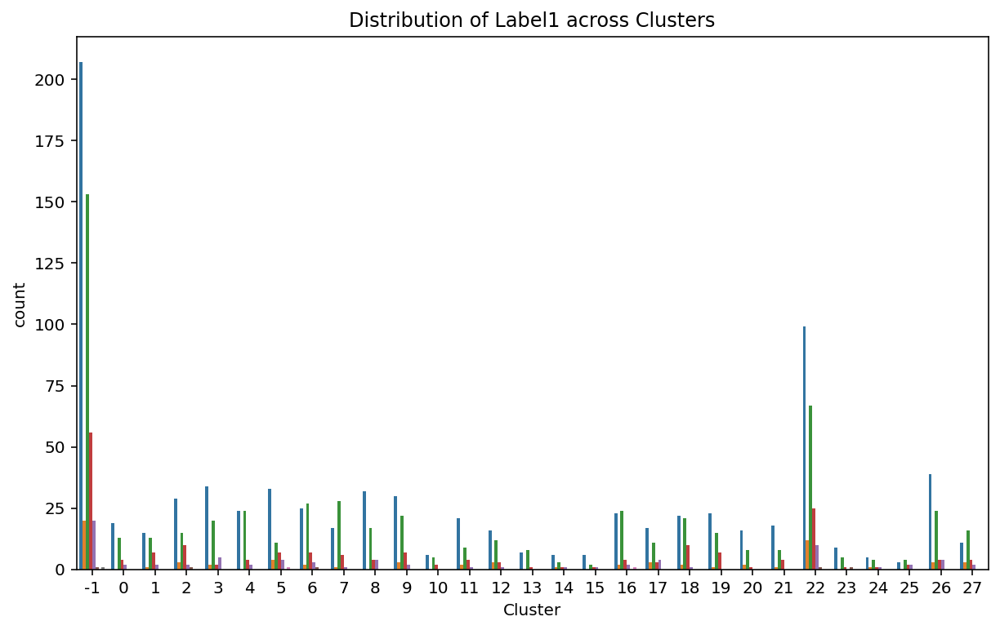

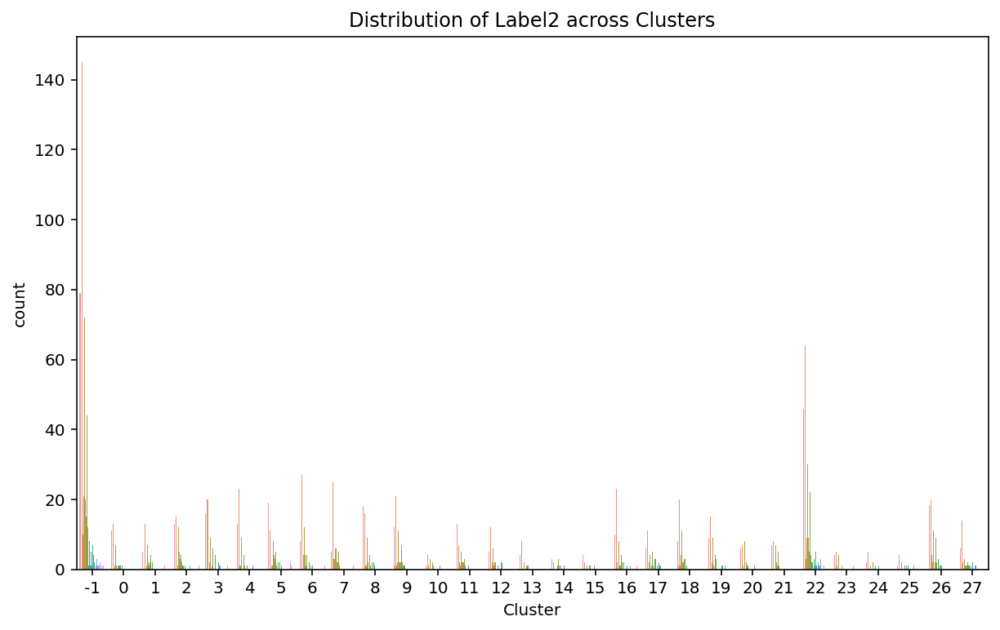

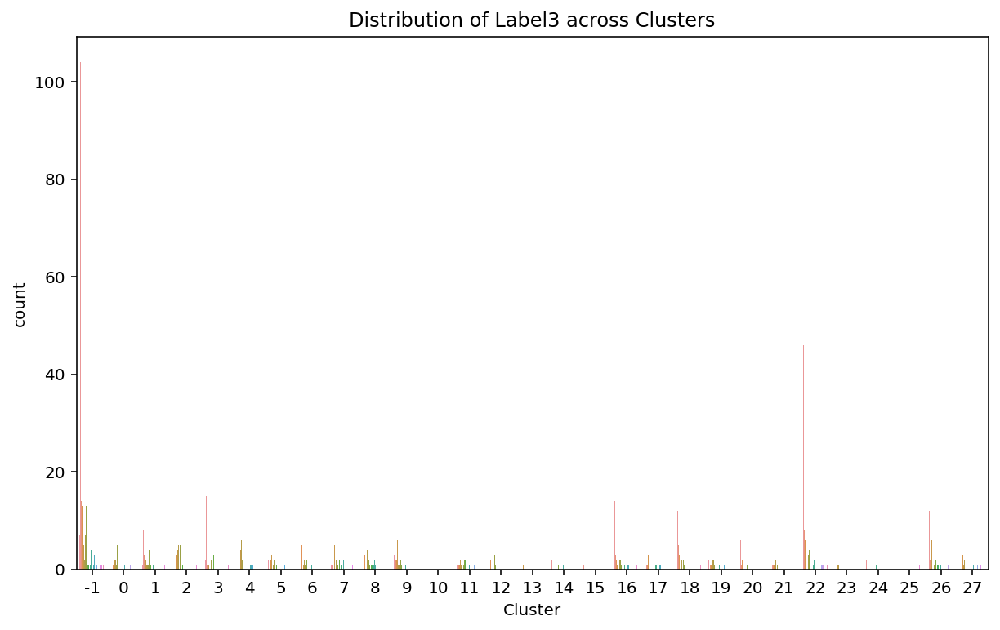

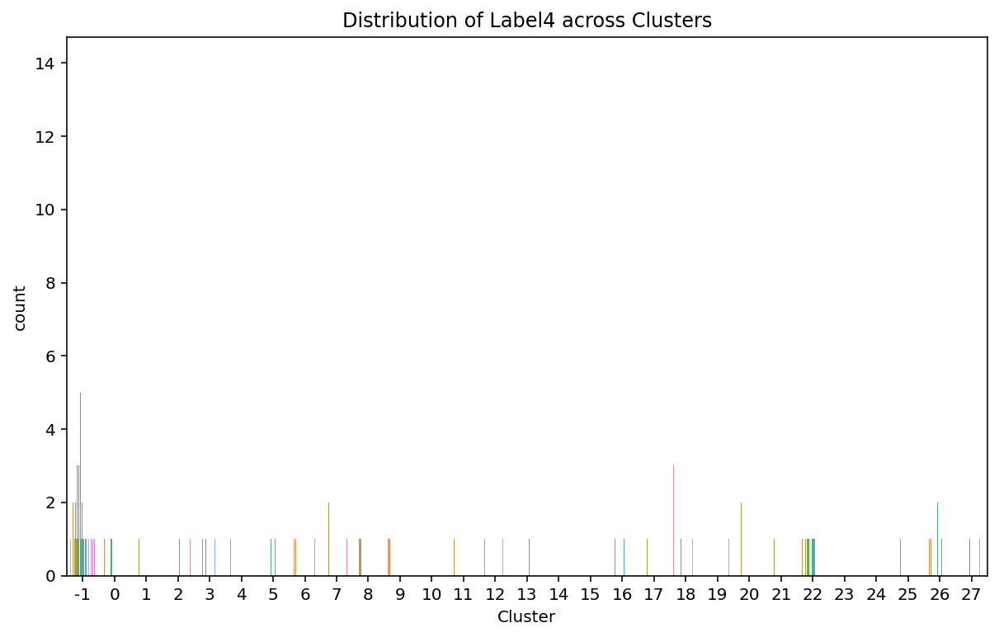

In [28]:
labels_transposed = labels.T

# Create a DataFrame that includes the cluster labels for each response
df = pd.DataFrame(data=labels_transposed, columns=['Label1', 'Label2', 'Label3', 'Label4'])
df['Cluster'] = cluster_labels

# Count each of the number of unique labels in each cluster
cluster_label_summary = df.groupby('Cluster').agg({
    'Label1': lambda x: x.value_counts().to_dict(),
    'Label2': lambda x: x.value_counts().to_dict(),
    'Label3': lambda x: x.value_counts().to_dict(),
    'Label4': lambda x: x.value_counts().to_dict()
})

# Plot distrubution of labels across all the clusters
for label in ['Label1', 'Label2', 'Label3', 'Label4']:
    plt.figure(figsize=(10, 6))
    ax = sns.countplot(data=df, x='Cluster', hue=label)
    plt.title(f'Distribution of {label} across Clusters')
    ax.legend_.remove()
    plt.show()

In the dataset, as the label numbers increased, the more specific they became towards the actual object, animal, or thing that was in the image. This is why as the image labels go down, the count decreases for each individual label. Attempting to see any trends across similar labels proved to be ineffective as the same image labels were spread out across several different clusters. 